In [1]:
#!/usr/bin/env conda run -n ska3 python
import os
import sys
import shutil
import time
import pytz
import traceback

from Ska.engarchive import fetch_sci as fetch
import Chandra.Time

from astropy.table import Table

import datetime as dt
import pytz
import matplotlib.dates as mdate
from matplotlib import gridspec

import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

import numpy as np
from scipy.interpolate import spline
from scipy.interpolate import interp1d
from scipy.signal import hilbert


from Scripts.msidlists import *
from Scripts.event_times import *
from Scripts.plot_stylers import *

%config InlineBackend.figure_format = 'retina'

In [2]:
fig_save_directory = '/Users/grant/HEAD/data/wdocs/tremblay/HRCOps/plots/thermals/'

Fetch all of the MSIDs

In [3]:
msids_daily = fetch.Msidset(monitor_temperature_msids, start='2000:001', stat='daily', filter_bad=True)
msids_5min = fetch.MSIDset(monitor_temperature_msids, start='2000:001', stat='5min', filter_bad=True)

#### Compute 30 day means and sort by ascending mean temeprature

Create the table

In [5]:
ave_table = Table() #Instantiate an empty AstroPy table that we can later sort

daybin = 100 # The number of days over which we'll compute the rolling average

all_names = []
all_means = []
all_stds = []

for msid in monitor_temperature_msids:
    mean = np.mean(msids_daily[msid].means[-daybin:]).round(2)
    std = np.std(msids_daily[msid].stds[-daybin:]).round(2)
    
    all_names.append(msid)
    all_means.append(mean)
    all_stds.append(std)
    
ave_table["MSID"] = all_names
ave_table["{} Day Average".format(daybin)] = all_means
ave_table["Standard Deviation"] = all_stds

In [6]:
ave_table

MSID,100 Day Average,Standard Deviation
str8,float32,float32
2FE00ATM,22.28,0.75
2LVPLATM,27.61,0.51
2IMHVATM,30.97,0.5
2IMINATM,19.36,0.62
2SPHVATM,31.09,0.5
2SPINATM,19.06,0.58
2PMT1T,21.34,0.78
2PMT2T,23.55,0.81
2DCENTRT,18.32,0.78


Sort the table in ascending order by Average temperature, so that we can make a pretty sequential plot later

In [7]:
ave_table.sort("{} Day Average".format(daybin))
ave_table

MSID,100 Day Average,Standard Deviation
str8,float32,float32
2UVLSPXT,14.58,0.77
2FRADPYT,16.34,1.05
2DCENTRT,18.32,0.78
2DTSTATT,18.79,0.82
2CONDMXT,19.03,0.94
2SPINATM,19.06,0.58
2IMINATM,19.36,0.62
2FHTRMZT,20.68,1.11
2PMT1T,21.34,0.78


Now we only actually need these names to define the plotting order. Create an array of these ordered names: 

In [8]:
ordered_msidlist = ave_table["MSID"]

#### Make plots

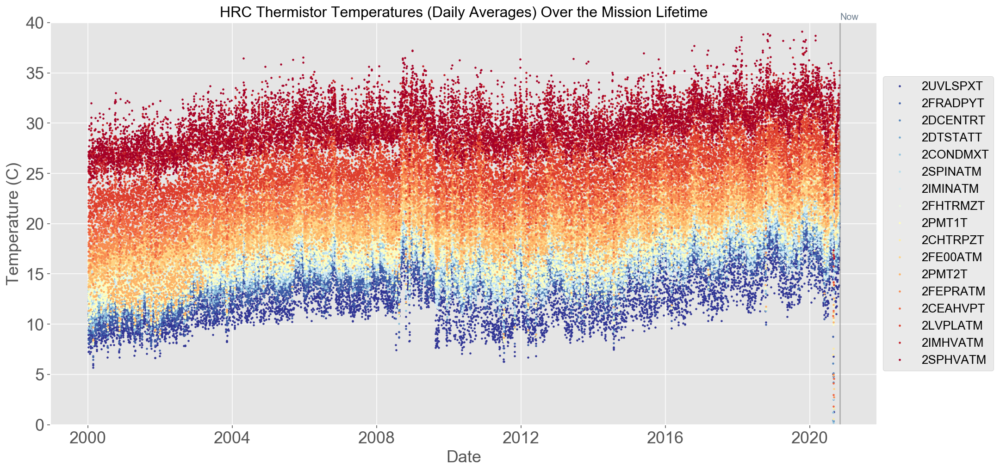

In [12]:
figure_savename = fig_save_directory + "thermals_daily.pdf"
rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points. 

fig, ax = plt.subplots(figsize=(16, 8))

n_lines = len(ordered_msidlist)
color_idx = np.linspace(0, 1, n_lines)


for i, msid in zip(color_idx, ordered_msidlist):
    ax.plot_date(hrc.convert_chandra_time(msids_daily[msid].times),
                 msids_daily[msid].means, '.', alpha=1.0, markersize=2.5, label='{}'.format(msid), color=plt.cm.RdYlBu_r(i),  rasterized=rasterized)

ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Date')
ax.set_ylim(0, 40)

# ax.set_xlim(dt.date(2018, 10, 6), dt.date(2018, 10, 30))
  
ax.set_title("HRC Thermistor Temperatures (Daily Averages) Over the Mission Lifetime")
    #ax.legend()
    #ax.set_ylim(10, 40)
ax.legend(prop={'size': 13}, loc='center left', bbox_to_anchor=(1, 0.5))

#ax.legend(loc=2, prop={'size': 13})

ax.axvline(dt.datetime.now(pytz.utc),
                       color='gray', alpha=0.5)
ax.text(dt.datetime.now(pytz.utc), ax.get_ylim()[1]+0.3,
        'Now', fontsize=10, color='slategray')

    
plt.show()

fig.savefig(figure_savename, dpi=300, bbox_inches='tight')

We can also easily take a yearly (i.e. 365 day window) moving average to smooth this out. This is effectively an efficient convolution. 

In [13]:
window = 365 # days, i.e. a year
time_corrector = window - 1 # Because this funtion will cut off the first 364 datapoints if your window is 365 days

def compute_yearly_average(values, window):
    
    array = values

    cumulative_sum, moving_aves = [0], []

    for i, x in enumerate(array, 1):
        cumulative_sum.append(cumulative_sum[i-1] + x)
        if i>=window:
            moving_ave = (cumulative_sum[i] - cumulative_sum[i-window])/window
            #can do stuff with moving_ave here
            moving_aves.append(moving_ave)
            
    # Ensure that this is a Numpy array, so that we can do some proper vector math with it. 
    moving_ave_array = np.asarray(moving_aves)
    return moving_ave_array
    

Run this function in a loop to compute and plot all moving averages

In [14]:
all_trends = {}

for msid in ordered_msidlist: 
    moving_aves = compute_yearly_average(msids_daily[msid].means, window)
    moving_stds = compute_yearly_average(msids_daily[msid].stds, window)
    all_trends["{}_trend".format(msid)] = moving_aves
    all_trends["{}_stds".format(msid)] = moving_stds

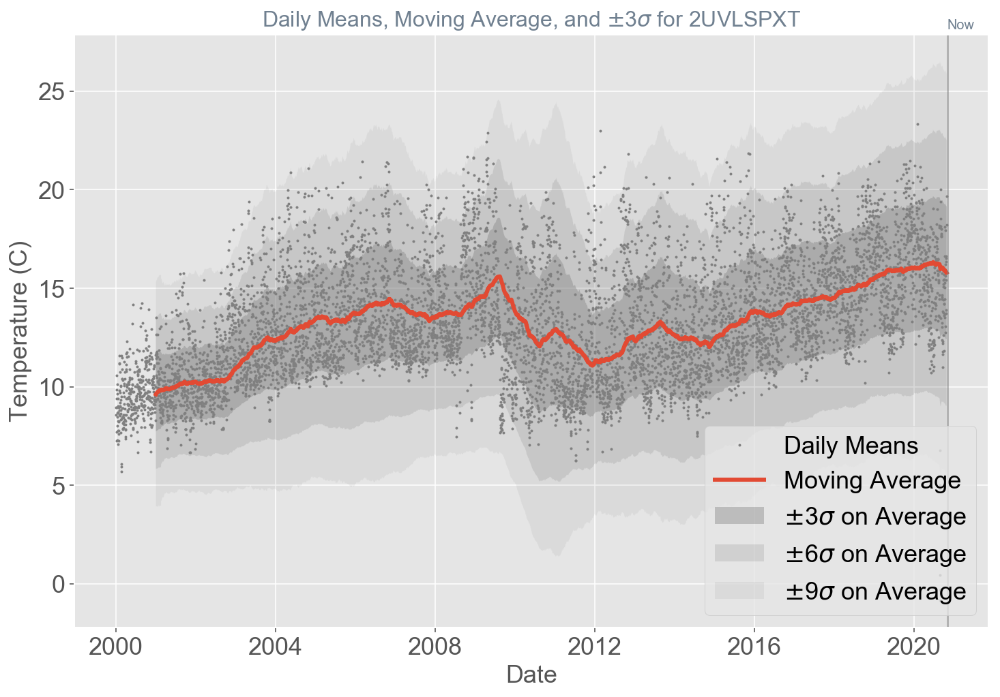

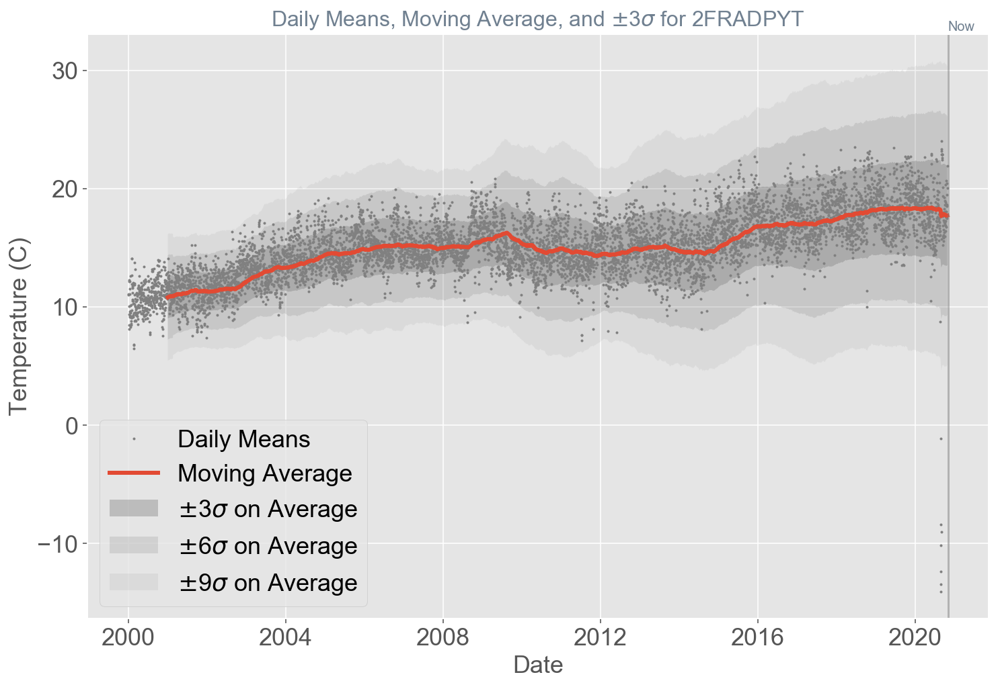

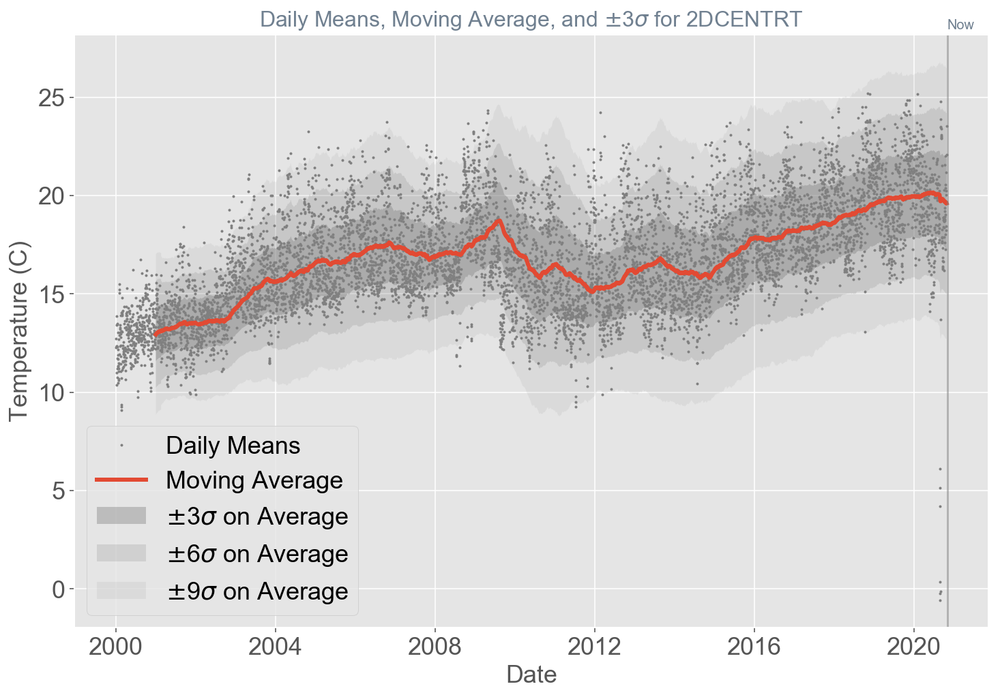

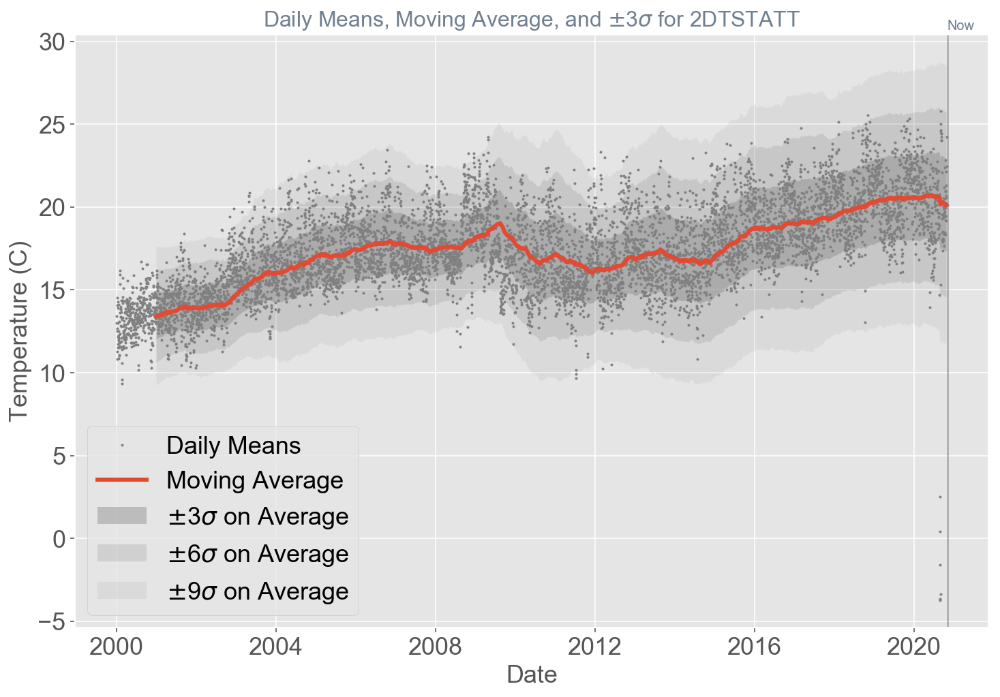

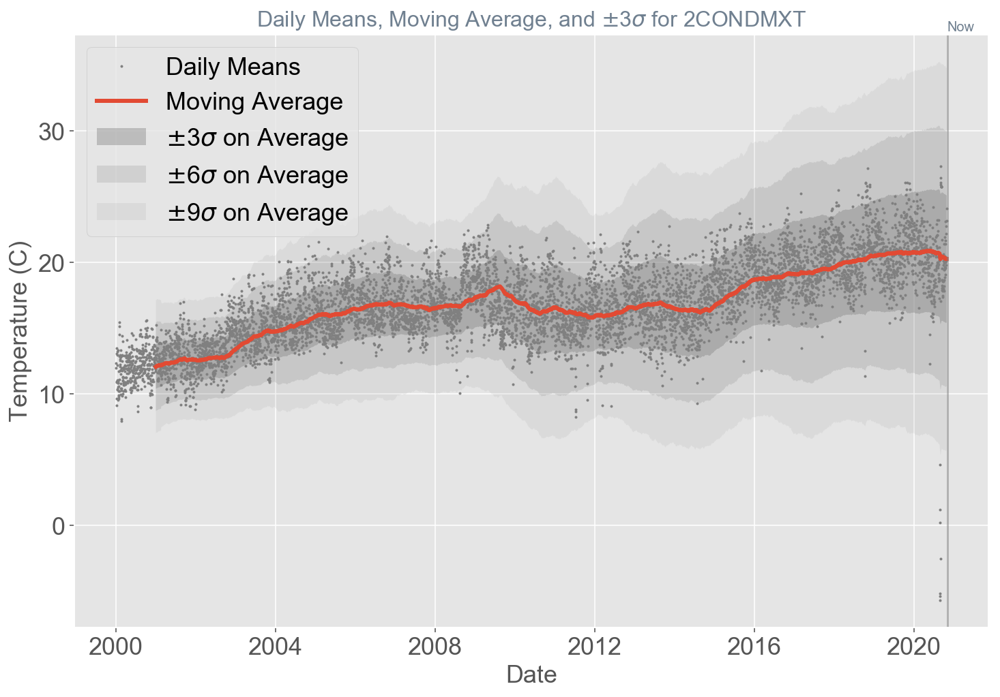

...

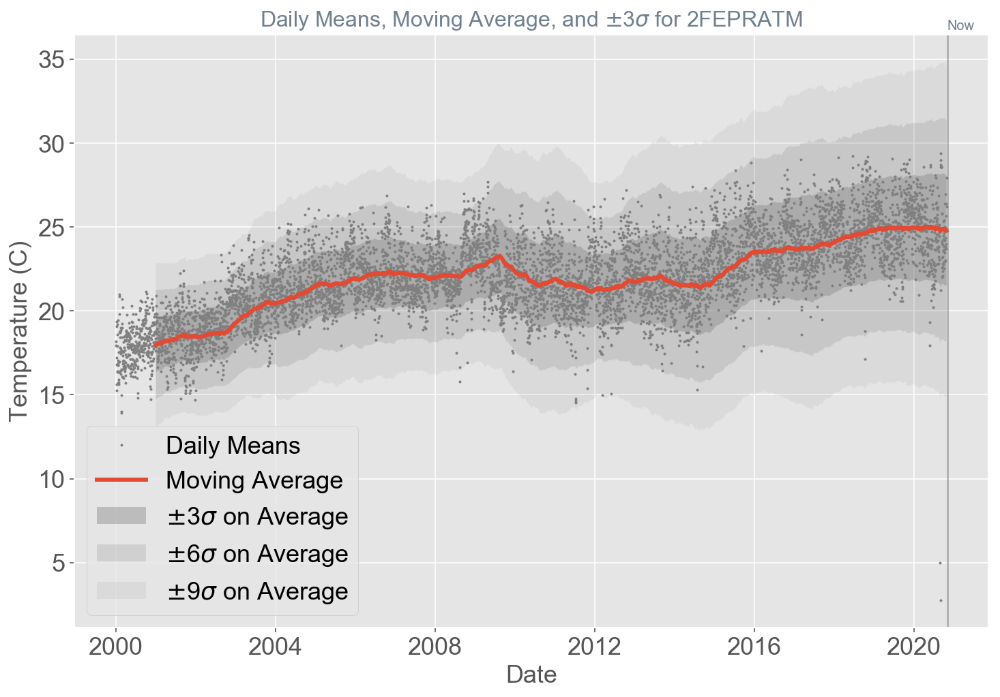

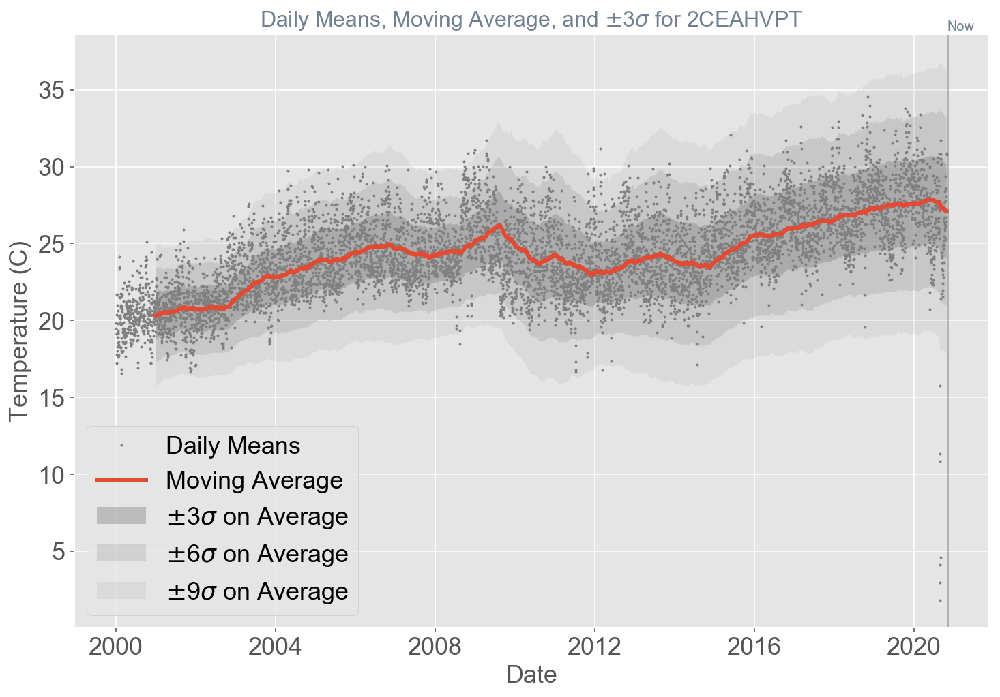

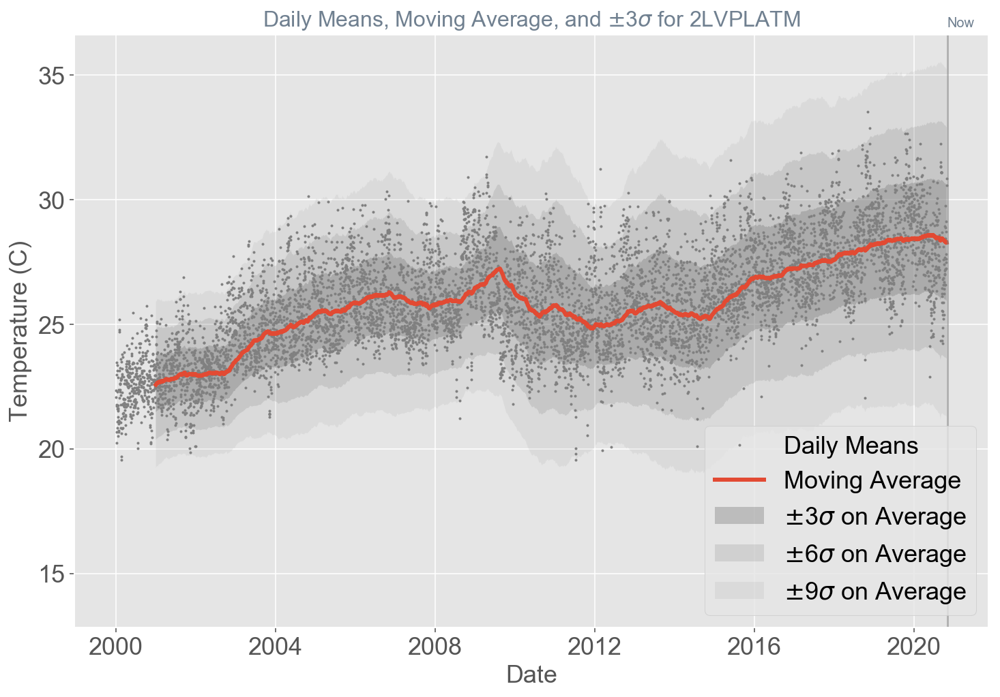

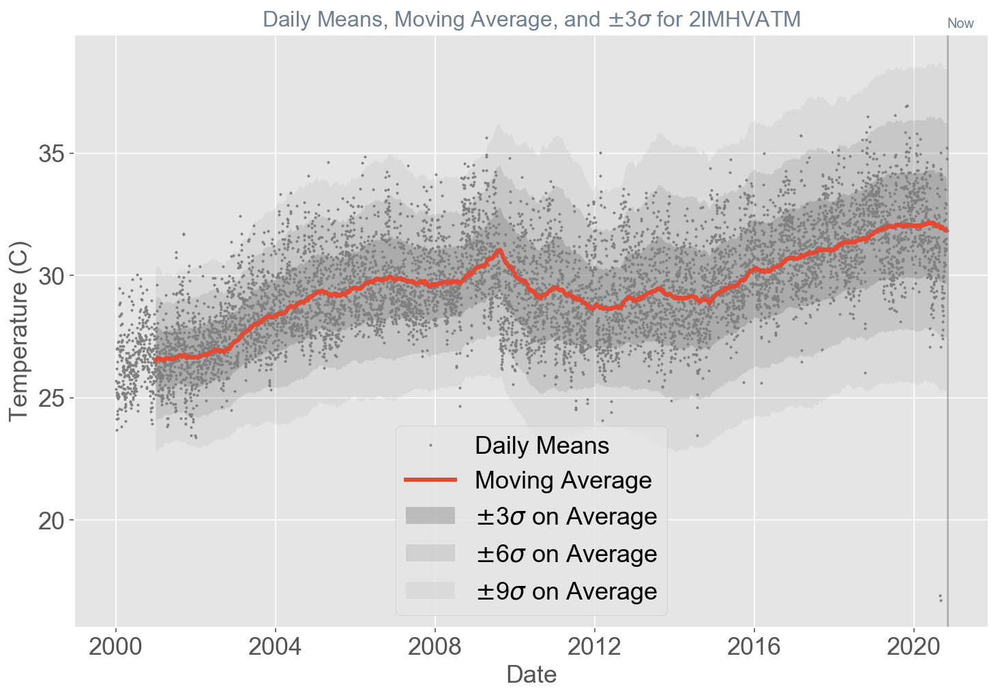

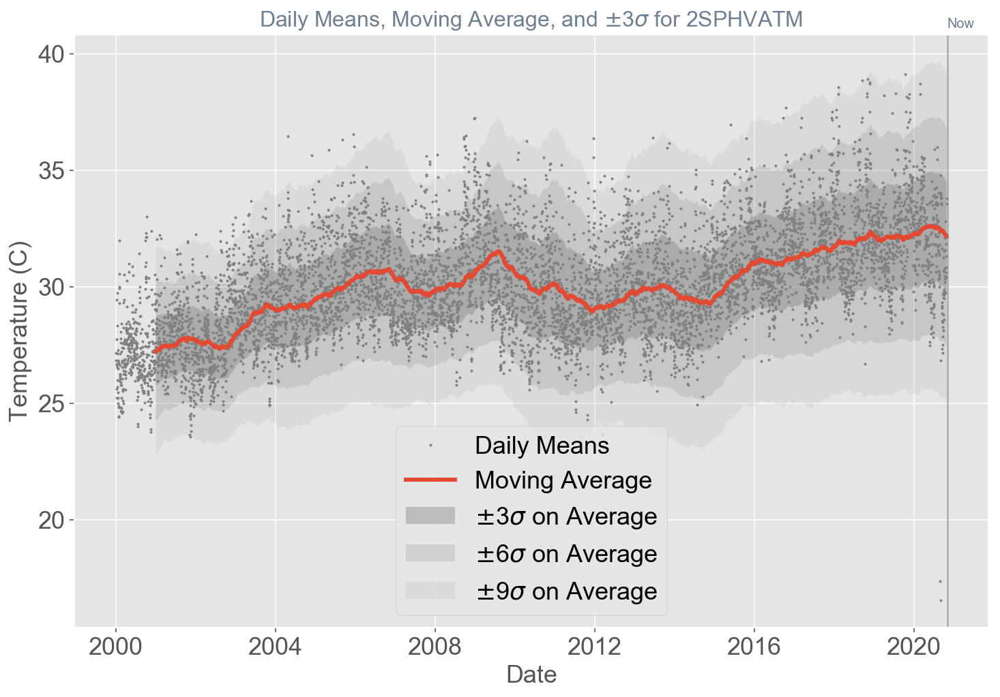

In [19]:

rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points. 


for msid in ordered_msidlist:
    
    figure_savename = fig_save_directory + "{}_trend.png".format(msid)
    
    times = hrc.convert_chandra_time(msids_daily[msid].times)

    fig, ax = plt.subplots(figsize=(12,8))

    ax.plot_date(times, msids_daily[msid].means, '.',markersize=2, color='gray', rasterized=rasterized, label="Daily Means")
    ax.plot_date(times[time_corrector:], all_trends["{}_trend".format(msid)], '-', lw=3, rasterized=rasterized, label="Moving Average")

    ax.fill_between(times[time_corrector:], all_trends["{}_trend".format(msid)] + 3*all_trends["{}_stds".format(msid)], all_trends["{}_trend".format(msid)] - 3*all_trends["{}_stds".format(msid)], facecolor='gray', alpha=0.4, label=r"$\pm$3$\sigma$ on Average")
    ax.fill_between(times[time_corrector:], all_trends["{}_trend".format(msid)] + 6*all_trends["{}_stds".format(msid)], all_trends["{}_trend".format(msid)] - 6*all_trends["{}_stds".format(msid)], facecolor='gray', alpha=0.2, label=r"$\pm$6$\sigma$ on Average")
    ax.fill_between(times[time_corrector:], all_trends["{}_trend".format(msid)] + 9*all_trends["{}_stds".format(msid)], all_trends["{}_trend".format(msid)] - 9*all_trends["{}_stds".format(msid)], facecolor='gray', alpha=0.1, label=r"$\pm$9$\sigma$ on Average")



    ax.set_ylabel("Temperature (C)")
    ax.set_xlabel("Date")

#     ax.set_ylim(20,40)

    ax.legend()
    
    ax.axvline(dt.datetime.now(pytz.utc),
                       color='gray', alpha=0.5)
    ax.text(dt.datetime.now(pytz.utc), ax.get_ylim()[1]+0.3,
            'Now', fontsize=10, color='slategray')

    ax.set_title(r"Daily Means, Moving Average, and $\pm$3$\sigma$ for {}".format(msid), color='slategray')

    plt.show()

    


    
    fig.savefig(figure_savename, dpi=300, bbox_inches='tight')
    
    plt.close()

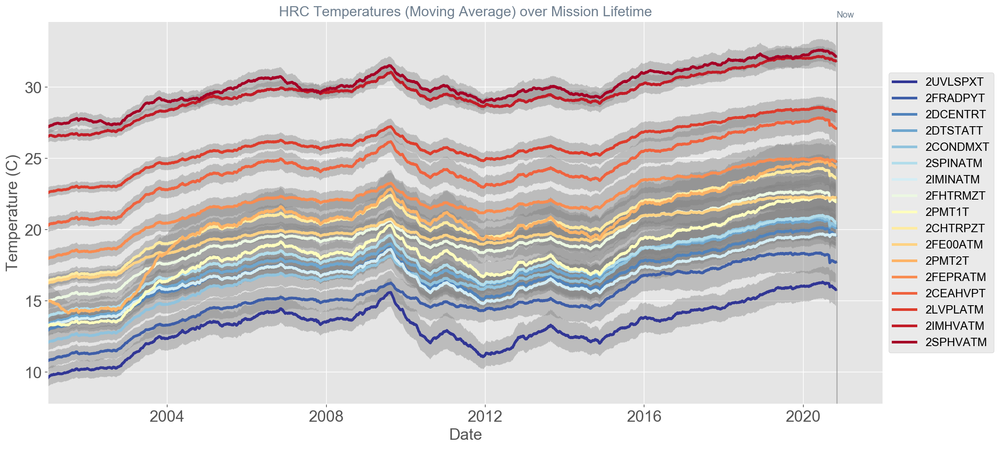

In [31]:
figure_savename = fig_save_directory + "all_trends_lifetime.png"
rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points.

fig, ax = plt.subplots(figsize=(17,8))

n_lines = len(ordered_msidlist)
color_idx = np.linspace(0, 1, n_lines)



for i, msid in zip(color_idx, ordered_msidlist):
    
    times = hrc.convert_chandra_time(msids_daily[msid].times)
    #ax.plot(all_trends["{}_trend".format(msidname)], lw=3.0, label=msidname, color=plt.cm.coolwarm(i))
    ax.plot_date(times[time_corrector:], all_trends["{}_trend".format(msid)], '-', label='{}'.format(msid), lw=3.0, color=plt.cm.RdYlBu_r(i), rasterized=rasterized)
    ax.fill_between(times[time_corrector:], all_trends["{}_trend".format(msid)] + all_trends["{}_stds".format(msid)], all_trends["{}_trend".format(msid)] - all_trends["{}_stds".format(msid)], facecolor='gray', alpha=0.4 )

ax.legend(prop={'size': 13}, loc='center left', bbox_to_anchor=(1, 0.5))
# plt.legend(title='title', bbox_to_anchor=(1.05, 1), loc='upper left')


ax.set_title("HRC Temperatures (Moving Average) over Mission Lifetime", color='slategray')
ax.set_ylabel("Temperature (C)")
ax.set_xlabel("Date")

ax.axvline(dt.datetime.now(pytz.utc),
                       color='gray', alpha=0.5)

ax.text(dt.datetime.now(pytz.utc), ax.get_ylim()[1]+0.3,
        'Now', fontsize=10, color='slategray')



ax.set_xlim(dt.datetime(2001, 1, 1), dt.datetime(2022, 1, 1))

plt.show()

fig.savefig(figure_savename, dpi=300, bbox_inches='tight')

---

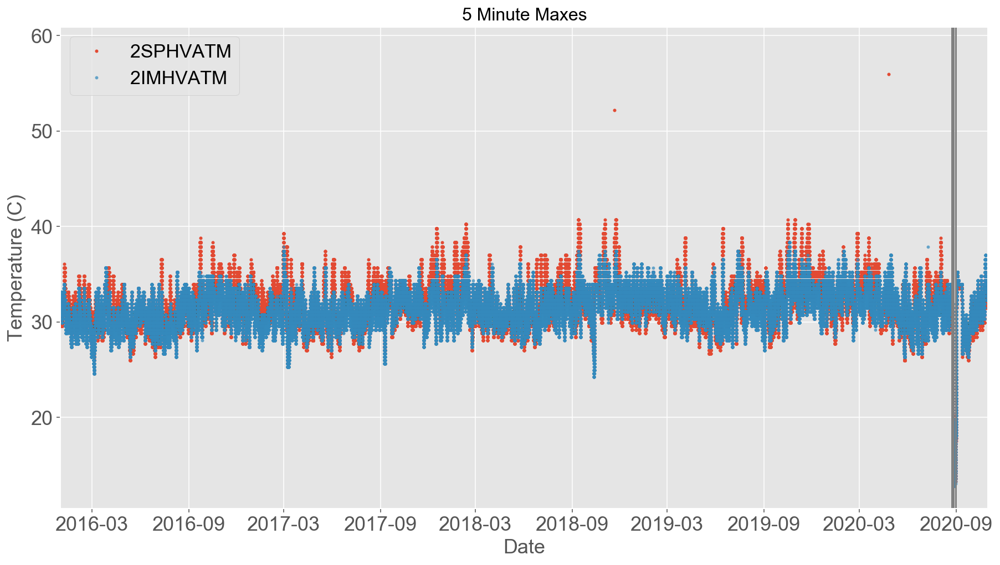

In [118]:
figure_savename = fig_save_directory + "thermals_test.png"
rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points. 

fig, ax = plt.subplots(figsize=(15, 8))

ax.plot_date(hrc.convert_chandra_time(msids_5min['2SPHVATM'].times), msids_5min['2SPHVATM'].maxes, markersize=2.0, label='2SPHVATM')
ax.plot_date(hrc.convert_chandra_time(msids_5min['2IMHVATM'].times), msids_5min['2IMHVATM'].maxes, markersize=2.0, alpha=0.6, label='2IMHVATM')

ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Date')
# ax.set_ylim(0, 40)

# ax.set_xlim(dt.date(2018, 10, 6), dt.date(2018, 10, 30))
  
ax.set_title("5 Minute Maxes")
    #ax.legend()
    #ax.set_ylim(10, 40)

ax.set_xlim(dt.datetime(2016, 1, 1), dt.datetime(2020, 11, 1))

ax.axvline(eventdate, color='gray')
# ax.axvline(hrc_poweroff_date, color='gray')
# ax.axvline(a_side_reset, color='gray')

ax.axvline(time_of_second_anomaly, color='gray')
# ax.axvline(time_of_second_shutdown, color='gray')

ax.axvline(time_of_cap_1543, color='gray')

ax.legend(loc=2, prop={'size': 17})
    
plt.show()

fig.savefig(figure_savename, dpi=300)

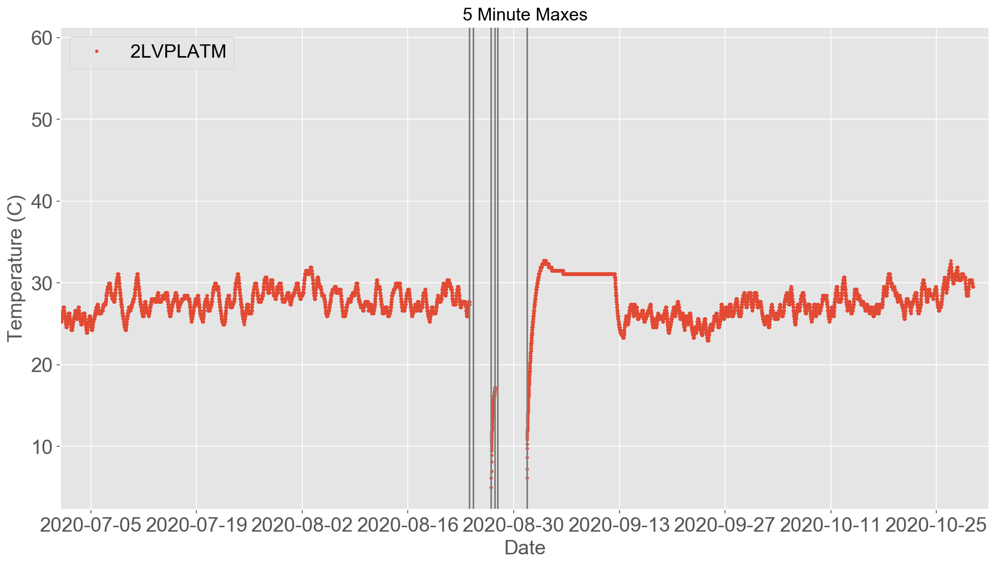

In [133]:
figure_savename = fig_save_directory + "thermals_test.png"
rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points. 

fig, ax = plt.subplots(figsize=(15, 8))

ax.plot_date(hrc.convert_chandra_time(msids_5min['2LVPLATM'].times), msids_5min['2LVPLATM'].maxes, markersize=2.0, label='2LVPLATM')
# ax.plot_date(hrc.convert_chandra_time(msids_5min['2IMHVATM'].times), msids_5min['2IMHVATM'].maxes, markersize=2.0, alpha=0.6, label='2IMHVATM')

ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Date')
# ax.set_ylim(0, 40)

# ax.set_xlim(dt.date(2018, 10, 6), dt.date(2018, 10, 30))
  
ax.set_title("5 Minute Maxes")
    #ax.legend()
    #ax.set_ylim(10, 40)

ax.set_xlim(dt.datetime(2020, 7, 1), dt.datetime(2020, 11, 1))

ax.axvline(eventdate, color='gray')
ax.axvline(hrc_poweroff_date, color='gray')
ax.axvline(a_side_reset, color='gray')

ax.axvline(time_of_second_anomaly, color='gray')
ax.axvline(time_of_second_shutdown, color='gray')

ax.axvline(time_of_cap_1543, color='gray')

ax.legend(loc=2, prop={'size': 17})
    
plt.show()

fig.savefig(figure_savename, dpi=300)

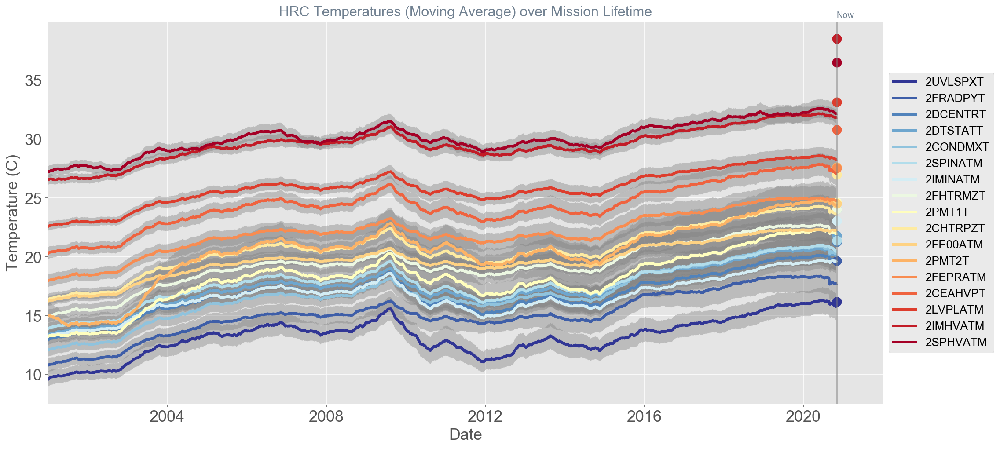

In [34]:
figure_savename = fig_save_directory + "all_trends_now.png"
rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points.

fig, ax = plt.subplots(figsize=(17,8))

n_lines = len(ordered_msidlist)
color_idx = np.linspace(0, 1, n_lines)



for i, msid in zip(color_idx, ordered_msidlist):
    
    times = hrc.convert_chandra_time(msids_daily[msid].times)
    #ax.plot(all_trends["{}_trend".format(msidname)], lw=3.0, label=msidname, color=plt.cm.coolwarm(i))
    ax.plot_date(times[time_corrector:], all_trends["{}_trend".format(msid)], '-', label='{}'.format(msid), lw=3.0, color=plt.cm.RdYlBu_r(i), rasterized=rasterized)
    ax.fill_between(times[time_corrector:], all_trends["{}_trend".format(msid)] + all_trends["{}_stds".format(msid)], all_trends["{}_trend".format(msid)] - all_trends["{}_stds".format(msid)], facecolor='gray', alpha=0.4 )

    # Draw a large point line where the current data point is
    with fetch.data_source('maude'):
        latest_datapoint = fetch.Msid(msid)
        ax.plot_date(hrc.convert_chandra_time(latest_datapoint.times)[-1], latest_datapoint.vals[-1], markersize=10.0, color=plt.cm.RdYlBu_r(i), rasterized=rasterized)
        
    
ax.legend(prop={'size': 13}, loc='center left', bbox_to_anchor=(1, 0.5))
# plt.legend(title='title', bbox_to_anchor=(1.05, 1), loc='upper left')


ax.set_title("HRC Temperatures (Moving Average) over Mission Lifetime", color='slategray')
ax.set_ylabel("Temperature (C)")
ax.set_xlabel("Date")

ax.axvline(dt.datetime.now(pytz.utc),
                       color='gray', alpha=0.5)

ax.text(dt.datetime.now(pytz.utc), ax.get_ylim()[1]+0.3,
        'Now', fontsize=10, color='slategray')



ax.set_xlim(dt.datetime(2001, 1, 1), dt.datetime(2022, 1, 1))

plt.show()

fig.savefig(figure_savename, dpi=300, bbox_inches='tight')

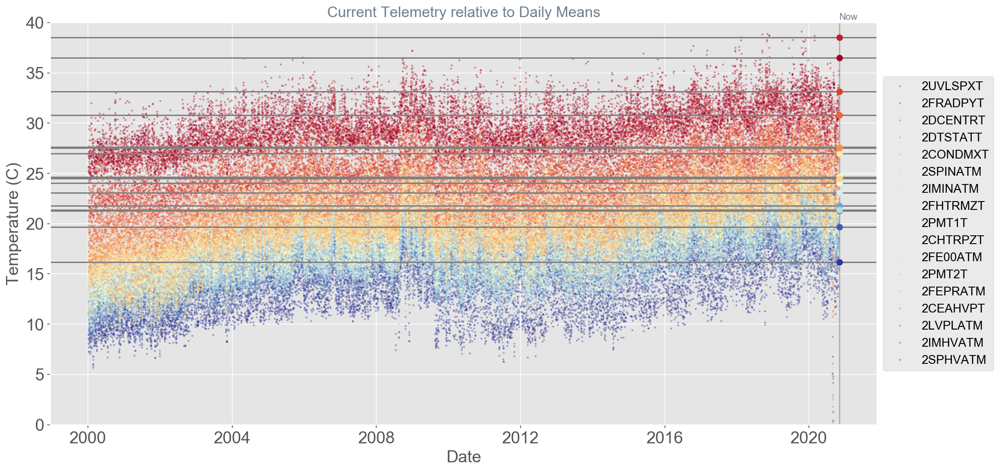

In [51]:
fetch.data_source('cxc')

figure_savename = fig_save_directory + "thermals_daily.png"
rasterized = True # Make this True to ensure the file size is small. Otherwise you're plotting thousands of vector points. 

fig, ax = plt.subplots(figsize=(16, 8))

n_lines = len(ordered_msidlist)
color_idx = np.linspace(0, 1, n_lines)


for i, msid in zip(color_idx, ordered_msidlist):
    ax.plot_date(hrc.convert_chandra_time(msids_daily[msid].times),
                 msids_daily[msid].means, '.', alpha=0.3, markersize=2.5, label='{}'.format(msid), color=plt.cm.RdYlBu_r(i),  rasterized=rasterized, zorder=1)

    
    # Draw a large point line where the current data point is
    with fetch.data_source('maude'):
        latest_datapoint = fetch.Msid(msid)
        ax.axhline(latest_datapoint.vals[-1], color='gray', zorder=2)
        ax.plot_date(hrc.convert_chandra_time(latest_datapoint.times)[-1], latest_datapoint.vals[-1], markersize=6.0, color=plt.cm.RdYlBu_r(i), rasterized=rasterized, zorder=3)
    
ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Date')
ax.set_ylim(0, 40)

# ax.set_xlim(dt.date(2018, 10, 6), dt.date(2018, 10, 30))
  
ax.set_title("Current Telemetry relative to Daily Means", color='slategray')
    #ax.legend()
    #ax.set_ylim(10, 40)
ax.legend(prop={'size': 13}, loc='center left', bbox_to_anchor=(1, 0.5))

#ax.legend(loc=2, prop={'size': 13})

ax.axvline(dt.datetime.now(pytz.utc),
                       color='gray', alpha=0.5)
ax.text(dt.datetime.now(pytz.utc), ax.get_ylim()[1]+0.3,
        'Now', fontsize=10, color='slategray')

    
plt.show()

fig.savefig(figure_savename, dpi=300, bbox_inches='tight')